In [1]:
# -*- coding: utf-8 -*-
import os
import numpy as np
import pandas as pd
from sklearn.metrics import average_precision_score

# =========================
# 0) 固定最优 AD 参数
# =========================
FOLD_DIR = "./best_xgb_5fold_saved"
N_FOLDS = 5

# 来自第一段超参数搜索结果
A_WEIGHT = 100.0
EPSILON = 1e-6
K_RATIO = 0.05
RHO_TH = 8.445e-08
IA_TH = 0.4438

# 与搜索脚本保持一致
LABEL_DIFF_MODE = "jaccard"
K_SWD_CAP = 300
MIN_IN_SAMPLES = 30

# 输出文件
OUT_DETAIL_CSV = os.path.join(FOLD_DIR, "AD_best_fixedparams_fold_detail.csv")
OUT_SAMPLE_CSV = os.path.join(FOLD_DIR, "AD_best_fixedparams_sample_level.csv")
OUT_SUMMARY_CSV = os.path.join(FOLD_DIR, "AD_best_fixedparams_summary.csv")
OUT_NPZ = os.path.join(FOLD_DIR, "AD_best_fixedparams_rho_IA_mask.npz")


# =========================
# 1) 工具函数
# =========================
def l2_normalize(X, eps=1e-12):
    X = X.astype(np.float32, copy=False)
    n = np.linalg.norm(X, axis=1, keepdims=True)
    return X / (n + eps)


def cosine_sim_query(Xq_n, Xtr_n):
    return np.clip(Xq_n @ Xtr_n.T, 0.0, 1.0).astype(np.float32)


def compute_weights(sim_vals, a, epsilon):
    s = np.clip(sim_vals, epsilon, 1.0)
    return np.exp(-a * (1.0 - s) / s).astype(np.float32)


def pairwise_label_diff_scalar(y_t, y_nei, mode="jaccard", eps=1e-12):
    y_t = y_t.astype(np.int8, copy=False)
    y_nei = y_nei.astype(np.int8, copy=False)

    if mode == "hamming":
        return np.mean(np.abs(y_nei - y_t[None, :]), axis=1).astype(np.float32)

    if mode == "jaccard":
        inter = np.sum((y_nei == 1) & (y_t[None, :] == 1), axis=1).astype(np.float32)
        union = np.sum((y_nei == 1) | (y_t[None, :] == 1), axis=1).astype(np.float32)
        j = inter / (union + eps)
        return (1.0 - j).astype(np.float32)

    raise ValueError("LABEL_DIFF_MODE must be 'jaccard' or 'hamming'")


def per_label_ap(y_true, y_prob):
    y_true = np.asarray(y_true).astype(np.int8)
    y_prob = np.asarray(y_prob).astype(np.float32)

    L = y_true.shape[1]
    ap = np.full(L, np.nan, dtype=float)

    for j in range(L):
        yt = y_true[:, j]
        if len(np.unique(yt)) < 2:
            continue
        ap[j] = average_precision_score(yt, y_prob[:, j])

    return ap


def macro_auprc_with_baseline_fill(y_true_in, y_prob_in, ap_baseline, label_idx):
    ap_in = per_label_ap(y_true_in, y_prob_in)

    ap_filled = ap_in.copy()
    nan_mask = np.isnan(ap_filled)
    ap_filled[nan_mask] = ap_baseline[nan_mask]

    return float(np.mean(ap_filled[label_idx]))


# =========================
# 2) 读取 fold 数据
# =========================
def load_fold_npz(fold_id: int):
    path = os.path.join(FOLD_DIR, f"fold_{fold_id:02d}.npz")

    if not os.path.exists(path):
        raise FileNotFoundError(f"找不到文件：{path}")

    z = np.load(path, allow_pickle=True)

    X_tr = z["X_tr"]
    y_tr = z["y_tr"]
    X_va = z["X_va"]
    y_va = z["y_va"]
    y_prob_va = z["y_prob_va"]

    smiles_va = None
    if "smiles_va" in z.files:
        smiles_va = z["smiles_va"]

    va_idx = None
    if "va_idx" in z.files:
        va_idx = z["va_idx"]

    return X_tr, y_tr, X_va, y_va, y_prob_va, smiles_va, va_idx


# =========================
# 3) SWD / rho / IA
# =========================
def compute_SWD_topk(Xtr, ytr, k_swd_eff, a, eps, fold_id=None, print_every=500):
    Xn = l2_normalize(Xtr)
    sim = cosine_sim_query(Xn, Xn)

    N = ytr.shape[0]
    SWD = np.zeros(N, dtype=np.float32)

    k_eff = max(1, min(k_swd_eff, N - 1))

    for t in range(N):
        sims_t = sim[t]

        idxs = np.argpartition(sims_t, -(k_eff + 1))[-(k_eff + 1):]
        idxs = idxs[idxs != t]

        if idxs.size > 0:
            sv = sims_t[idxs]
            w = compute_weights(sv, a, eps)
            diffs = pairwise_label_diff_scalar(
                ytr[t],
                ytr[idxs],
                mode=LABEL_DIFF_MODE
            )

            SWD[t] = float((w * sv * diffs).sum() / (w.sum() + eps))

        if fold_id is not None:
            if (t + 1) % print_every == 0 or (t + 1) == N:
                print(f"    [SWD fold {fold_id}] {t + 1}/{N} done", flush=True)

    return SWD, Xn


def compute_rho_IA_given_SWD(Xtr_n, SWD, Xva, k_eff, a, eps):
    Xva_n = l2_normalize(Xva)
    sim_qt = cosine_sim_query(Xva_n, Xtr_n)

    M = Xva.shape[0]
    rho = np.zeros(M, dtype=np.float32)
    IA = np.zeros(M, dtype=np.float32)

    for i in range(M):
        sims = sim_qt[i]

        idxk = np.argpartition(sims, -k_eff)[-k_eff:]
        sk = sims[idxk]

        w = compute_weights(sk, a, eps)

        rho[i] = float(w.mean())
        IA[i] = float((w * SWD[idxk]).sum() / (w.sum() + eps))

    return rho, IA




In [2]:

print("\n========== FIXED BEST AD PARAMS ==========")
print(f"a        = {A_WEIGHT}")
print(f"eps      = {EPSILON:.0e}")
print(f"k_ratio  = {K_RATIO}")
print(f"rho_th   = {RHO_TH:.8e}")
print(f"IA_th    = {IA_TH:.8e}")
print(f"MIN_IN   = {MIN_IN_SAMPLES}")

# -------------------------
# 读取五折数据
# -------------------------
folds = []

for f in range(1, N_FOLDS + 1):
    item = load_fold_npz(f)
    folds.append(item)

# -------------------------
# 全验证集 baseline AP
# 与搜索脚本一致
# -------------------------
Y_all = np.concatenate([x[3] for x in folds], axis=0)
P_all = np.concatenate([x[4] for x in folds], axis=0)

ap_baseline = per_label_ap(Y_all, P_all)

label_idx = np.array(
    [j for j in range(Y_all.shape[1]) if not np.isnan(ap_baseline[j])],
    dtype=int
)

print(f"\n[INFO] evaluable labels: {len(label_idx)}/{Y_all.shape[1]}")

fold_rows = []
sample_rows = []

all_rho_list = []
all_IA_list = []
all_in_mask_list = []
all_y_true_list = []
all_y_prob_list = []
all_fold_id_list = []

# -------------------------
# 逐折计算 rho / IA，并固定阈值判定 in-domain
# -------------------------
for fold_id, (X_tr, y_tr, X_va, y_va, y_prob_va, smiles_va, va_idx) in enumerate(folds, start=1):
    Ntr = X_tr.shape[0]
    Nva = X_va.shape[0]

    k_swd_eff = min(max(int(0.1 * Ntr), 1), K_SWD_CAP)

    k_eff = max(int(float(K_RATIO) * Ntr), 1)
    k_eff = min(k_eff, Ntr)

    print(
        f"\n[INFO] fold {fold_id}: "
        f"Ntr={Ntr}, Nva={Nva}, k_eff={k_eff}, k_swd_eff={k_swd_eff}"
    )

    SWD, Xtr_n = compute_SWD_topk(
        X_tr,
        y_tr,
        k_swd_eff,
        A_WEIGHT,
        EPSILON,
        fold_id=fold_id,
        print_every=500
    )

    rho_s, IA = compute_rho_IA_given_SWD(
        Xtr_n,
        SWD,
        X_va,
        k_eff,
        A_WEIGHT,
        EPSILON
    )

    in_m = (rho_s >= RHO_TH) & (IA <= IA_TH)

    n_in = int(in_m.sum())
    coverage = n_in / Nva

    auprc_all = macro_auprc_with_baseline_fill(
        y_va,
        y_prob_va,
        ap_baseline,
        label_idx
    )

    if n_in >= MIN_IN_SAMPLES:
        auprc_in = macro_auprc_with_baseline_fill(
            y_va[in_m],
            y_prob_va[in_m],
            ap_baseline,
            label_idx
        )
        used_in_search_mean = 1
    else:
        auprc_in = np.nan
        used_in_search_mean = 0

    fold_rows.append({
        "fold": fold_id,
        "n_train": int(Ntr),
        "n_valid": int(Nva),
        "n_in": int(n_in),
        "coverage_in": float(coverage),
        "AUPRC_all": float(auprc_all),
        "AUPRC_in": float(auprc_in) if np.isfinite(auprc_in) else np.nan,
        "used_in_search_mean": int(used_in_search_mean),
        "rho_th": float(RHO_TH),
        "IA_th": float(IA_TH),
        "a": float(A_WEIGHT),
        "eps": float(EPSILON),
        "k_ratio": float(K_RATIO),
        "k_eff": int(k_eff),
        "k_swd_eff": int(k_swd_eff),
        "rho_min": float(np.min(rho_s)),
        "rho_q05": float(np.quantile(rho_s, 0.05)),
        "rho_median": float(np.median(rho_s)),
        "rho_q95": float(np.quantile(rho_s, 0.95)),
        "rho_max": float(np.max(rho_s)),
        "IA_min": float(np.min(IA)),
        "IA_q05": float(np.quantile(IA, 0.05)),
        "IA_median": float(np.median(IA)),
        "IA_q95": float(np.quantile(IA, 0.95)),
        "IA_max": float(np.max(IA)),
    })

    for i in range(Nva):
        row = {
            "fold": fold_id,
            "local_valid_index": int(i),
            "rho_s": float(rho_s[i]),
            "IA": float(IA[i]),
            "in_domain": int(in_m[i]),
        }

        if smiles_va is not None:
            row["SMILES"] = str(smiles_va[i])

        if va_idx is not None:
            row["original_index"] = int(va_idx[i])

        sample_rows.append(row)

    all_rho_list.append(rho_s)
    all_IA_list.append(IA)
    all_in_mask_list.append(in_m)
    all_y_true_list.append(y_va)
    all_y_prob_list.append(y_prob_va)
    all_fold_id_list.append(np.full(Nva, fold_id, dtype=np.int32))

    print(
        f"[FOLD {fold_id}] "
        f"n_in={n_in}/{Nva}, "
        f"coverage={coverage:.4f}, "
        f"AUPRC_all={auprc_all:.4f}, "
        f"AUPRC_in={auprc_in:.4f}" if np.isfinite(auprc_in) else
        f"[FOLD {fold_id}] "
        f"n_in={n_in}/{Nva}, "
        f"coverage={coverage:.4f}, "
        f"AUPRC_all={auprc_all:.4f}, "
        f"AUPRC_in=nan"
    )

# -------------------------
# 保存逐折结果
# -------------------------
detail_df = pd.DataFrame(fold_rows)
detail_df.to_csv(OUT_DETAIL_CSV, index=False, encoding="utf-8-sig")
print(f"\n[SAVED] {OUT_DETAIL_CSV}")

# -------------------------
# 保存样本级结果
# -------------------------
sample_df = pd.DataFrame(sample_rows)
sample_df.to_csv(OUT_SAMPLE_CSV, index=False, encoding="utf-8-sig")
print(f"[SAVED] {OUT_SAMPLE_CSV}")

# -------------------------
# 汇总结果
# 搜索脚本中的 mean_ap / mean_cov 只统计 n_in >= MIN_IN_SAMPLES 的 fold
# -------------------------
used_df = detail_df[detail_df["used_in_search_mean"] == 1].copy()

if len(used_df) > 0:
    search_consistent_AUPRC_in = float(np.nanmean(used_df["AUPRC_in"].values))
    search_consistent_coverage_in = float(np.mean(used_df["coverage_in"].values))
else:
    search_consistent_AUPRC_in = np.nan
    search_consistent_coverage_in = np.nan

summary = {
    "a": float(A_WEIGHT),
    "eps": float(EPSILON),
    "k_ratio": float(K_RATIO),
    "rho_th": float(RHO_TH),
    "IA_th": float(IA_TH),
    "MIN_IN_SAMPLES": int(MIN_IN_SAMPLES),

    "n_folds_total": int(N_FOLDS),
    "n_folds_used_for_search_mean": int(len(used_df)),

    "AUPRC_in_search_consistent_mean": search_consistent_AUPRC_in,
    "coverage_in_search_consistent_mean": search_consistent_coverage_in,

    "AUPRC_in_allfold_nanmean": float(np.nanmean(detail_df["AUPRC_in"].values)),
    "coverage_in_allfold_mean": float(np.mean(detail_df["coverage_in"].values)),

    "n_valid_total": int(detail_df["n_valid"].sum()),
    "n_in_total": int(detail_df["n_in"].sum()),
    "coverage_in_total": float(detail_df["n_in"].sum() / detail_df["n_valid"].sum()),

    "AUPRC_all_mean": float(np.mean(detail_df["AUPRC_all"].values)),
}

summary_df = pd.DataFrame([summary])
summary_df.to_csv(OUT_SUMMARY_CSV, index=False, encoding="utf-8-sig")
print(f"[SAVED] {OUT_SUMMARY_CSV}")

# -------------------------
# 保存 npz，方便后续画图或筛选 in-domain 样本
# -------------------------
all_rho = np.concatenate(all_rho_list)
all_IA = np.concatenate(all_IA_list)
all_in_mask = np.concatenate(all_in_mask_list)
all_y_true = np.concatenate(all_y_true_list, axis=0)
all_y_prob = np.concatenate(all_y_prob_list, axis=0)
all_fold_id = np.concatenate(all_fold_id_list)

np.savez_compressed(
    OUT_NPZ,
    rho_s=all_rho.astype(np.float32),
    IA=all_IA.astype(np.float32),
    in_domain=all_in_mask.astype(np.int8),
    y_true=all_y_true.astype(np.int8),
    y_prob=all_y_prob.astype(np.float32),
    fold_id=all_fold_id.astype(np.int32),
    a=np.array([A_WEIGHT], dtype=np.float32),
    eps=np.array([EPSILON], dtype=np.float32),
    k_ratio=np.array([K_RATIO], dtype=np.float32),
    rho_th=np.array([RHO_TH], dtype=np.float32),
    IA_th=np.array([IA_TH], dtype=np.float32),
)

print(f"[SAVED] {OUT_NPZ}")

print("\n========== SUMMARY ==========")
print(f"AUPRC_in search-consistent mean = {summary['AUPRC_in_search_consistent_mean']:.6f}")
print(f"coverage search-consistent mean = {summary['coverage_in_search_consistent_mean']:.6f}")
print(f"AUPRC_all mean                  = {summary['AUPRC_all_mean']:.6f}")
print(f"total in-domain                 = {summary['n_in_total']}/{summary['n_valid_total']}")
print(f"total coverage                  = {summary['coverage_in_total']:.6f}")




========== FIXED BEST AD PARAMS ==========
a        = 100.0
eps      = 1e-06
k_ratio  = 0.05
rho_th   = 8.44500000e-08
IA_th    = 4.43800000e-01
MIN_IN   = 30

[INFO] evaluable labels: 24/24

[INFO] fold 1: Ntr=3004, Nva=752, k_eff=150, k_swd_eff=300
    [SWD fold 1] 500/3004 done
    [SWD fold 1] 1000/3004 done
    [SWD fold 1] 1500/3004 done
    [SWD fold 1] 2000/3004 done
    [SWD fold 1] 2500/3004 done
    [SWD fold 1] 3000/3004 done
    [SWD fold 1] 3004/3004 done
[FOLD 1] n_in=192/752, coverage=0.2553, AUPRC_all=0.4319, AUPRC_in=0.4988

[INFO] fold 2: Ntr=3005, Nva=751, k_eff=150, k_swd_eff=300
    [SWD fold 2] 500/3005 done
    [SWD fold 2] 1000/3005 done
    [SWD fold 2] 1500/3005 done
    [SWD fold 2] 2000/3005 done
    [SWD fold 2] 2500/3005 done
    [SWD fold 2] 3000/3005 done
    [SWD fold 2] 3005/3005 done
[FOLD 2] n_in=178/751, coverage=0.2370, AUPRC_all=0.4291, AUPRC_in=0.5348

[INFO] fold 3: Ntr=3005, Nva=751, k_eff=150, k_swd_eff=300
    [SWD fold 3] 500/3005 done
   

In [3]:

# =========================
# 6) 绘图前：裁剪 x/y 范围（只显示这段范围内的网格）
# =========================
# 你想规定的 x/y 轴范围（按需要改）
X_LIM = (0.0, 0.1)   # rho_th 范围示例：自己调整
Y_LIM = (0.0, 1.00)  # IA_th  范围示例：自己调整

# X_mesh / Y_mesh 来自 meshgrid(rho_cuts, IA_cuts)
rho_cuts = X_mesh[0, :]      # (GRID_SIZE,)
ia_cuts  = Y_mesh[:, 0]      # (GRID_SIZE,)

j_mask = (rho_cuts >= X_LIM[0]) & (rho_cuts <= X_LIM[1])
i_mask = (ia_cuts  >= Y_LIM[0]) & (ia_cuts  <= Y_LIM[1])

# 裁剪后的网格和Z
Xc = X_mesh[np.ix_(i_mask, j_mask)]
Yc = Y_mesh[np.ix_(i_mask, j_mask)]
mean_n_c = mean_n[np.ix_(i_mask, j_mask)]
mean_ap_in_c = mean_ap_in[np.ix_(i_mask, j_mask)]

# best 点也要判断是否在显示范围内（不在就不画星）
best_in_view = (X_LIM[0] <= best_rho_th <= X_LIM[1]) and (Y_LIM[0] <= best_ia_th <= Y_LIM[1])

# =========================
# 6) 绘图 1：count surface（标 best 点）
# =========================
fig1 = plt.figure(figsize=(6, 5), dpi=500)
ax1 = fig1.add_subplot(1, 1, 1, projection='3d')

ax1.plot_surface(
    Xc, Yc, mean_n_c,
    cmap='Blues',
    edgecolor='k', linewidth=0.2, antialiased=True,
    vmin=0, vmax=np.nanmax(mean_n_c)
)

# 规定 x/y 轴显示范围（关键）
ax1.set_xlim(X_LIM)
ax1.set_ylim(Y_LIM)

ax1.tick_params(axis='both', labelsize=12, width=1.5)
for tck in ax1.get_xticklabels() + ax1.get_yticklabels() + ax1.get_zticklabels():
    tck.set_fontweight('bold')
ax1.view_init(elev=45, azim=-45)
from matplotlib.ticker import MaxNLocator, FormatStrFormatter


# --- 1) 减少刻度数量（关键）---
ax1.xaxis.set_major_locator(MaxNLocator(5))  # x轴最多5个刻度
ax1.yaxis.set_major_locator(MaxNLocator(4))  # y轴最多5个刻度
ax1.zaxis.set_major_locator(MaxNLocator(5))  # z轴可选

# --- 2) 统一格式（避免长数字挤）---
ax1.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax1.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
# z轴如果是整数可用 '%.0f'，否则也用 '%.2f'
# ax1.zaxis.set_major_formatter(FormatStrFormatter('%.0f'))



# --- 4) 稍微调整视角也能明显改善（可选）---
ax1.view_init(elev=38, azim=-55)


if best_in_view:
    # 用裁剪后的 Z 最大值来决定标注高度
    n_best_local = float(mean_n_c.max()) if np.isfinite(mean_n_c).any() else 0.0
    z_high = n_best + (np.nanmax(mean_n_c) * 0.03)

    txt = ax1.text(
        best_rho_th, best_ia_th, z_high + (np.nanmax(mean_n_c) * 0.01),
        f"n≈{int(round(n_best))}",
        color='red', fontsize=12, fontweight='bold',
        ha='center', zorder=11
    )

plt.tight_layout()
if SAVE_FIG:
    fig1.savefig(OUT_FIG1, bbox_inches="tight")
    print("[SAVED]", OUT_FIG1)
plt.show()



NameError: name 'X_mesh' is not defined

In [8]:
# -*- coding: utf-8 -*-
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from matplotlib.ticker import FuncFormatter, MaxNLocator

# =========================================================
# 1) 绘图配置
# =========================================================
GRID_SIZE_PLOT = 55
SAVE_FIG = True

OUT_FIG_COUNT = os.path.join(FOLD_DIR, "AD_surface_count_logaxis_best_fixed.png")
OUT_FIG_AUPRC = os.path.join(FOLD_DIR, "AD_surface_AUPRC_logaxis_best_fixed.png")
OUT_GRID_CSV  = os.path.join(FOLD_DIR, "AD_grid_stats_logaxis_best_fixed.csv")

BEST_RHO_TH = float(RHO_TH)
BEST_IA_TH  = float(IA_TH)

# ---------------------------------------------------------
# 手动控制显示范围：使用 log10 阈值范围
# 例如 rho_th=9.624e-14 -> log10≈-13.02
#      IA_th =1.721e-7  -> log10≈-6.76
# ---------------------------------------------------------
RHO_LOG_LIM = (-9, -6)   # 横轴 rho_th 显示范围：1e-15 到 1e-9
IA_LOG_LIM  = (-1.0, 0.0)   # 纵轴 IA_th  显示范围：1e-8 到 1e-5

# 如果你想看更窄范围，可以改成：
# RHO_LOG_LIM = (-14.5, -11.5)
# IA_LOG_LIM  = (-7.5, -6.0)


# =========================================================
# 2) 评价函数：不重新计算 rho / IA，只用前一个 cell 已经得到的结果
# =========================================================
def eval_threshold_for_plot(rho_th, ia_th):
    """
    与搜索脚本一致：
    - 每折 n_in >= MIN_IN_SAMPLES 才计算该折 AUPRC_in
    - AUPRC_in 对有效折求均值
    - count 和 coverage 对所有折求均值
    """
    cnt_list = []
    cov_list = []
    ap_list = []
    used_cov_list = []

    for rho_s, IA, y_va, y_prob_va in zip(
        all_rho_list,
        all_IA_list,
        all_y_true_list,
        all_y_prob_list
    ):
        in_m = (rho_s >= rho_th) & (IA <= ia_th)
        n_in = int(in_m.sum())
        cov = n_in / len(rho_s)

        cnt_list.append(n_in)
        cov_list.append(cov)

        if n_in >= MIN_IN_SAMPLES:
            ap_in = macro_auprc_with_baseline_fill(
                y_va[in_m],
                y_prob_va[in_m],
                ap_baseline,
                label_idx
            )
            ap_list.append(ap_in)
            used_cov_list.append(cov)
        else:
            ap_list.append(np.nan)

    mean_n = float(np.mean(cnt_list))
    mean_cov_all = float(np.mean(cov_list))

    if np.any(np.isfinite(ap_list)):
        mean_ap = float(np.nanmean(ap_list))
        mean_cov_used = float(np.mean(used_cov_list))
    else:
        mean_ap = np.nan
        mean_cov_used = np.nan

    return mean_n, mean_cov_all, mean_ap, mean_cov_used


# =========================================================
# 3) 构建 log10 网格
# =========================================================
rho_log_cuts = np.linspace(RHO_LOG_LIM[0], RHO_LOG_LIM[1], GRID_SIZE_PLOT)
ia_log_cuts  = np.linspace(IA_LOG_LIM[0],  IA_LOG_LIM[1],  GRID_SIZE_PLOT)

rho_cuts = 10 ** rho_log_cuts
ia_cuts  = 10 ** ia_log_cuts

X_log_mesh, Y_log_mesh = np.meshgrid(rho_log_cuts, ia_log_cuts)

mean_n = np.zeros((GRID_SIZE_PLOT, GRID_SIZE_PLOT), dtype=np.float64)
mean_cov = np.zeros_like(mean_n)
mean_ap_in = np.full_like(mean_n, np.nan, dtype=np.float64)

records = []

print("\n[INFO] evaluating log-scale grid for plotting...")

for i, ia_th in enumerate(ia_cuts):
    for j, rho_th in enumerate(rho_cuts):
        n_mean, cov_all, ap_mean, cov_used = eval_threshold_for_plot(rho_th, ia_th)

        mean_n[i, j] = n_mean
        mean_cov[i, j] = cov_all
        mean_ap_in[i, j] = ap_mean

        records.append({
            "rho_log10": float(rho_log_cuts[j]),
            "IA_log10": float(ia_log_cuts[i]),
            "rho_th": float(rho_th),
            "IA_th": float(ia_th),
            "count_in_mean": float(n_mean),
            "coverage_in_mean_allfold": float(cov_all),
            "AUPRC_in_mean": float(ap_mean) if np.isfinite(ap_mean) else np.nan,
            "coverage_in_mean_usedfold": float(cov_used) if np.isfinite(cov_used) else np.nan,
            "a": float(A_WEIGHT),
            "eps": float(EPSILON),
            "k_ratio": float(K_RATIO),
            "rho_best": float(BEST_RHO_TH),
            "IA_best": float(BEST_IA_TH),
            "MIN_IN_SAMPLES": int(MIN_IN_SAMPLES),
        })

pd.DataFrame(records).to_csv(OUT_GRID_CSV, index=False, encoding="utf-8-sig")
print("[SAVED]", OUT_GRID_CSV)


# =========================================================
# 4) 固定最优点结果
# =========================================================
n_best, cov_best_all, ap_best, cov_best_used = eval_threshold_for_plot(
    BEST_RHO_TH,
    BEST_IA_TH
)

best_x = np.log10(BEST_RHO_TH)
best_y = np.log10(BEST_IA_TH)

print("\n========== FIXED BEST POINT ==========")
print(f"rho_th        = {BEST_RHO_TH:.8e}")
print(f"IA_th         = {BEST_IA_TH:.8e}")
print(f"log10 rho_th  = {best_x:.3f}")
print(f"log10 IA_th   = {best_y:.3f}")
print(f"mean n_in     = {n_best:.3f}")
print(f"mean cov all  = {cov_best_all:.6f}")
print(f"mean AUPRC_in = {ap_best:.6f}")
print(f"mean cov used = {cov_best_used:.6f}")


# =========================================================
# 5) 坐标轴格式函数：显示成 1e-14、1e-13 这种形式
# =========================================================
def sci_tick_from_log10(x, pos=None):
    """
    x 是 log10(value)，显示为 1e-14 这种格式。
    """
    if not np.isfinite(x):
        return ""
    exp = int(round(x))
    return f"1e{exp}"


def set_clean_3d_axis(ax, z_is_count=False):
    ax.set_xlim(RHO_LOG_LIM)
    ax.set_ylim(IA_LOG_LIM)

    ax.set_xlabel(r"$\rho_s$ threshold", fontsize=11, labelpad=8)
    ax.set_ylabel(r"$IA$ threshold", fontsize=11, labelpad=8)

    ax.xaxis.set_major_formatter(FuncFormatter(sci_tick_from_log10))
    ax.yaxis.set_major_formatter(FuncFormatter(sci_tick_from_log10))

    # 坐标轴刻度数量控制
    ax.set_xticks(np.linspace(RHO_LOG_LIM[0], RHO_LOG_LIM[1], 4))
    ax.set_yticks(np.linspace(IA_LOG_LIM[0], IA_LOG_LIM[1], 4))

    if z_is_count:
        ax.zaxis.set_major_locator(MaxNLocator(4, integer=True))
    else:
        ax.zaxis.set_major_locator(MaxNLocator(4))

    ax.tick_params(axis="x", labelsize=9, pad=2)
    ax.tick_params(axis="y", labelsize=9, pad=2)
    ax.tick_params(axis="z", labelsize=9, pad=2)

    # 视角：减少坐标轴文字遮挡
    ax.view_init(elev=28, azim=-52)

    # 网格线适度变淡
    ax.xaxis._axinfo["grid"]["linewidth"] = 0.6
    ax.yaxis._axinfo["grid"]["linewidth"] = 0.6
    ax.zaxis._axinfo["grid"]["linewidth"] = 0.6


best_in_view = (
    RHO_LOG_LIM[0] <= best_x <= RHO_LOG_LIM[1]
    and IA_LOG_LIM[0] <= best_y <= IA_LOG_LIM[1]
)





[INFO] evaluating log-scale grid for plotting...
[SAVED] ./best_xgb_5fold_saved/AD_grid_stats_logaxis_best_fixed.csv

========== FIXED BEST POINT ==========
rho_th        = 8.44500000e-08
IA_th         = 4.43800000e-01
log10 rho_th  = -7.073
log10 IA_th   = -0.353
mean n_in     = 189.000
mean cov all  = 0.251596
mean AUPRC_in = 0.545264
mean cov used = 0.251596


[SAVED] ./best_xgb_5fold_saved/AD_surface_count_logaxis_best_fixed.png


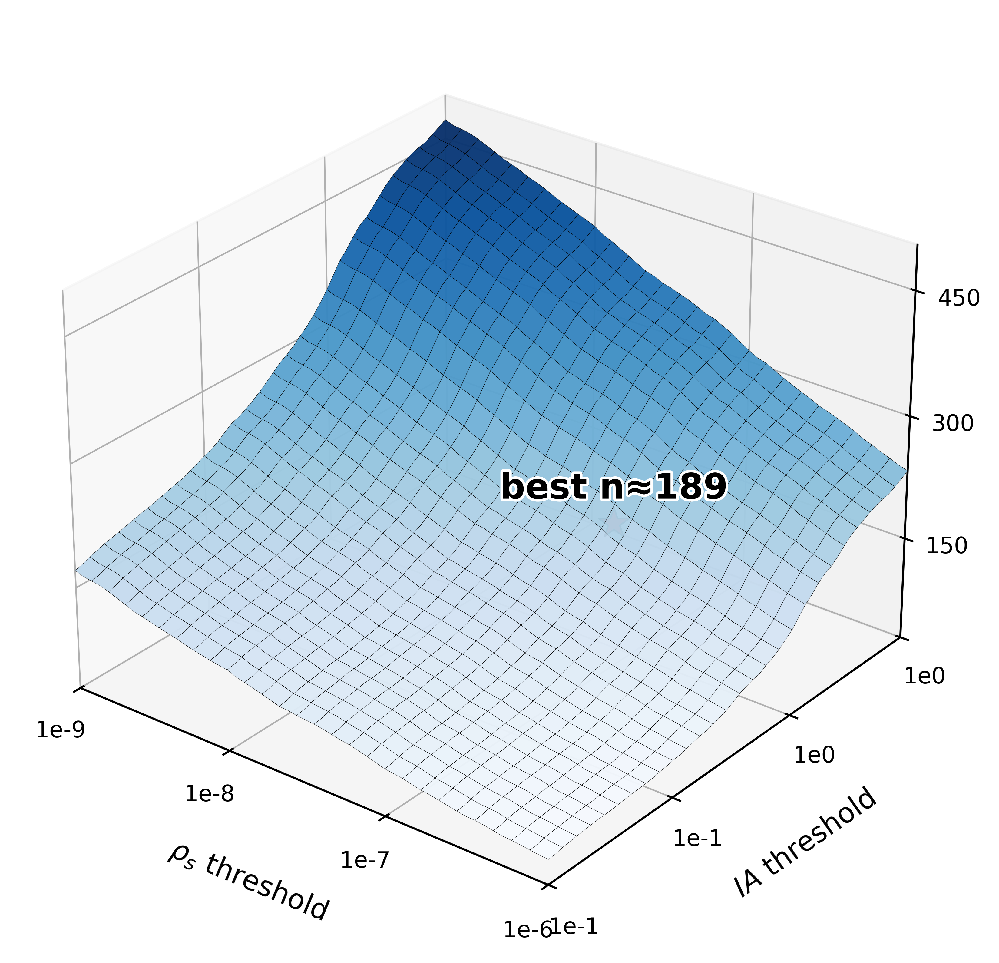

[SAVED] ./best_xgb_5fold_saved/AD_surface_AUPRC_logaxis_best_fixed.png


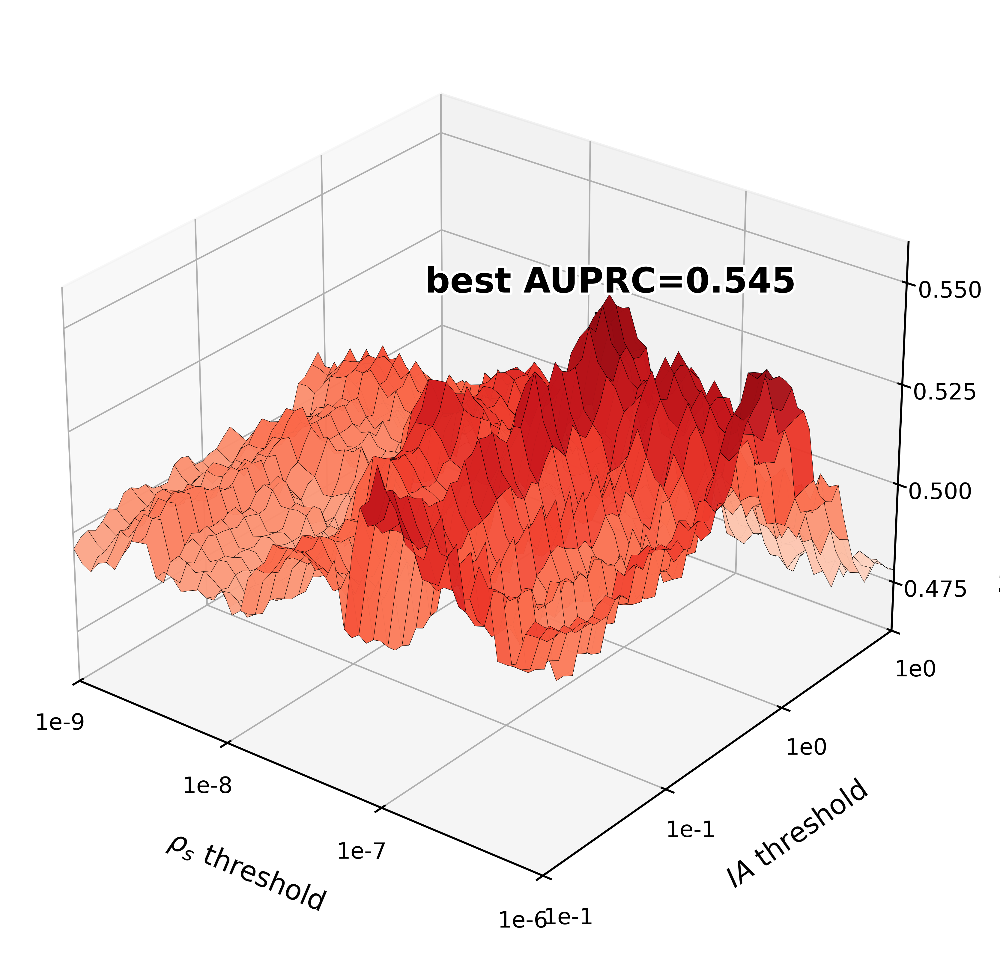

In [9]:
# =========================================================
# 6) 图 1：in-domain count surface
# =========================================================
fig1 = plt.figure(figsize=(7.0, 5.4), dpi=600)
ax1 = fig1.add_subplot(1, 1, 1, projection="3d")

surf1 = ax1.plot_surface(
    X_log_mesh,
    Y_log_mesh,
    mean_n,
    cmap="Blues",
    edgecolor="k",
    linewidth=0.12,
    antialiased=True,
    alpha=0.96
)

ax1.set_zlabel("Mean in-domain count", fontsize=11, labelpad=7)
set_clean_3d_axis(ax1, z_is_count=True)

if best_in_view:
    z_best = float(n_best)
    z_range = np.nanmax(mean_n) - np.nanmin(mean_n)
    z_offset = 0.05 * z_range if z_range > 0 else 1.0

    ax1.scatter(
        [best_x],
        [best_y],
        [z_best],
        color="red",
        marker="*",
        s=160,
        edgecolor="black",
        linewidth=0.6,
        depthshade=False,
        zorder=10
    )

    txt = ax1.text(
        best_x,
        best_y,
        z_best + z_offset,
        f"best n≈{int(round(n_best))}",
        color="black",
        fontsize=14,
        fontweight="bold",
        ha="center",
        va="bottom",
        zorder=11
    )
    txt.set_path_effects([pe.withStroke(linewidth=2.0, foreground="white")])

# cbar1 = fig1.colorbar(surf1, ax=ax1, shrink=0.58, pad=0.08)
# cbar1.set_label("Mean count", fontsize=10)
# cbar1.ax.tick_params(labelsize=8)
# cbar1.locator = MaxNLocator(5)
# cbar1.update_ticks()

plt.tight_layout()

if SAVE_FIG:
    fig1.savefig(OUT_FIG_COUNT, bbox_inches="tight")
    print("[SAVED]", OUT_FIG_COUNT)

plt.show()


# =========================================================
# 7) 图 2：AUPRC_in surface
# =========================================================
valid_ap = mean_ap_in[np.isfinite(mean_ap_in)]

if valid_ap.size == 0:
    raise ValueError(
        "当前 log 坐标范围内没有有效 AUPRC_in。"
        "请扩大 RHO_LOG_LIM / IA_LOG_LIM，或检查 MIN_IN_SAMPLES。"
    )

fig2 = plt.figure(figsize=(7.0, 5.4), dpi=600)
ax2 = fig2.add_subplot(1, 1, 1, projection="3d")

Z_ap = np.ma.masked_invalid(mean_ap_in)

surf2 = ax2.plot_surface(
    X_log_mesh,
    Y_log_mesh,
    Z_ap,
    cmap="Reds",
    edgecolor="k",
    linewidth=0.12,
    antialiased=True,
    alpha=0.96,
    vmin=np.nanmin(valid_ap),
    vmax=np.nanmax(valid_ap)
)

ax2.set_zlabel("Mean AUPRC in-domain", fontsize=11, labelpad=7)
set_clean_3d_axis(ax2, z_is_count=False)

if best_in_view and np.isfinite(ap_best):
    z_best = float(ap_best)
    z_range = np.nanmax(valid_ap) - np.nanmin(valid_ap)
    z_offset = 0.05 * z_range if z_range > 0 else 0.005

    ax2.scatter(
        [best_x],
        [best_y],
        [z_best],
        color="red",
        marker="*",
        s=160,
        edgecolor="black",
        linewidth=0.6,
        depthshade=False,
        zorder=10
    )

    txt = ax2.text(
        best_x,
        best_y,
        z_best + z_offset,
        f"best AUPRC={ap_best:.3f}",
        color="black",
        fontsize=14,
        fontweight="bold",
        ha="center",
        va="bottom",
        zorder=11
    )
    txt.set_path_effects([pe.withStroke(linewidth=2.0, foreground="white")])

# cbar2 = fig2.colorbar(surf2, ax=ax2, shrink=0.58, pad=0.08)
# cbar2.set_label("Mean AUPRC", fontsize=10)
# cbar2.ax.tick_params(labelsize=8)
# cbar2.locator = MaxNLocator(5)
# cbar2.update_ticks()

plt.tight_layout()

if SAVE_FIG:
    fig2.savefig(OUT_FIG_AUPRC, bbox_inches="tight")
    print("[SAVED]", OUT_FIG_AUPRC)

plt.show()

[SAVED] ./best_xgb_5fold_saved/AD_surface_count_logaxis_best_fixed.png


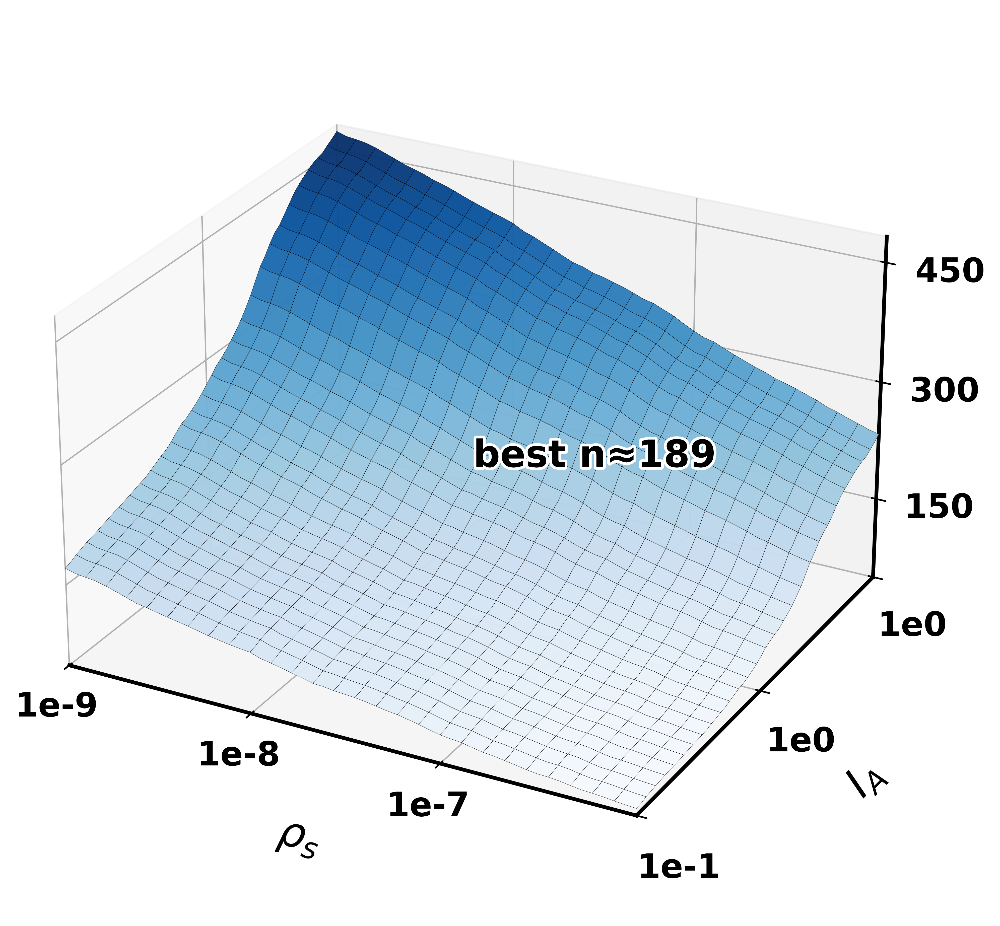

[SAVED] ./best_xgb_5fold_saved/AD_surface_AUPRC_logaxis_best_fixed.png


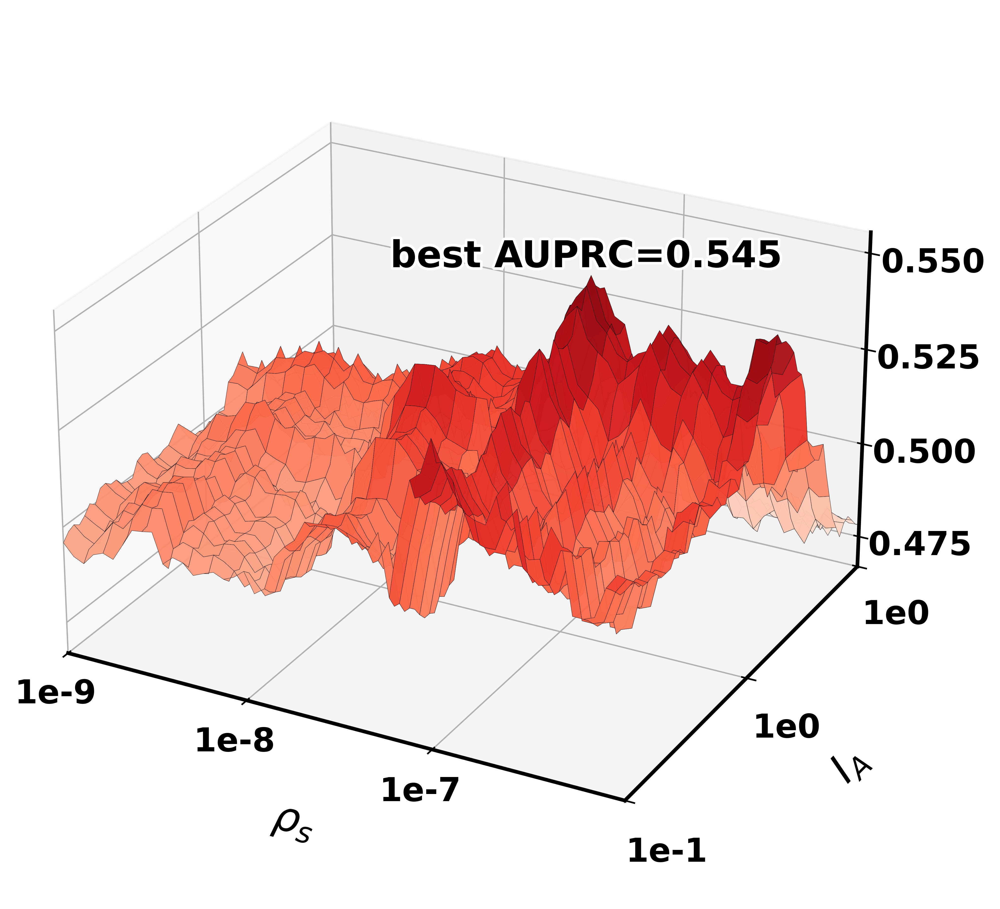

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from matplotlib.ticker import FuncFormatter, MaxNLocator

# =========================================================
# 0) 坐标轴显示参数
# =========================================================
# 这里的坐标是 log10 坐标，例如 -13 表示 1e-13
RHO_TICK_LOGS = [-9, -8, -7]      # 去掉 -9，避免和 y 轴 1e-8 在角落重叠
IA_TICK_LOGS  = [-1, -0.5, 0]

AXIS_LABEL_SIZE = 20
TICK_LABEL_SIZE = 16
Z_LABEL_SIZE = 16
BEST_TEXT_SIZE = 18

def sci_tick_from_log10(x, pos=None):
    """
    x 是 log10(value)，显示为 1e-14 这种形式。
    """
    if not np.isfinite(x):
        return ""
    exp = int(round(x))
    return f"1e{exp}"

def set_clean_3d_axis(ax, z_is_count=False):
    """
    统一 3D 图坐标轴样式。
    """
    ax.set_xlim(RHO_LOG_LIM)
    ax.set_ylim(IA_LOG_LIM)

    # x/y 轴标题：加粗放大
    ax.set_xlabel(r"$\rho_s$", fontsize=AXIS_LABEL_SIZE, fontweight="bold", labelpad=16)
    ax.set_ylabel(r"$I_{A}$", fontsize=AXIS_LABEL_SIZE, fontweight="bold", labelpad=20)

    #if z_is_count:
    #    ax.set_zlabel("Mean in-domain count", fontsize=Z_LABEL_SIZE, fontweight="bold", labelpad=14)
    #else:
    #    ax.set_zlabel("Mean AUPRC in-domain", fontsize=Z_LABEL_SIZE, fontweight="bold", labelpad=14)

    # x/y 轴刻度显示为 1e-xx
    ax.xaxis.set_major_formatter(FuncFormatter(sci_tick_from_log10))
    ax.yaxis.set_major_formatter(FuncFormatter(sci_tick_from_log10))

    # 减少刻度数量，避免重叠
    ax.set_xticks(RHO_TICK_LOGS)
    ax.set_yticks(IA_TICK_LOGS)

    if z_is_count:
        ax.zaxis.set_major_locator(MaxNLocator(4, integer=True))
    else:
        ax.zaxis.set_major_locator(MaxNLocator(4))

    # 刻度字体加粗放大
    ax.tick_params(axis="x", labelsize=TICK_LABEL_SIZE, pad=2, width=1.5)
    ax.tick_params(axis="y", labelsize=TICK_LABEL_SIZE, pad=8, width=1.5)
    ax.tick_params(axis="z", labelsize=TICK_LABEL_SIZE, pad=10, width=1.5)

    for tick in ax.get_xticklabels() + ax.get_yticklabels() + ax.get_zticklabels():
        tick.set_fontweight("bold")

    # 调整 3D 视角，减少 x/y 轴文字在前角处重叠
    ax.view_init(elev=26, azim=-62)

    # 拉开 x/y/z 比例，改善标签间距
    ax.set_box_aspect((1.35, 1.18, 0.82))

    # 网格线稍微变细
    ax.xaxis._axinfo["grid"]["linewidth"] = 0.65
    ax.yaxis._axinfo["grid"]["linewidth"] = 0.65
    ax.zaxis._axinfo["grid"]["linewidth"] = 0.65

    # 坐标轴线加粗
    try:
        ax.xaxis.line.set_linewidth(1.8)
        ax.yaxis.line.set_linewidth(1.8)
        ax.zaxis.line.set_linewidth(1.8)
    except Exception:
        pass


# =========================================================
# 6) 图 1：in-domain count surface
# =========================================================
fig1 = plt.figure(figsize=(8.2, 6.2), dpi=600)
ax1 = fig1.add_subplot(1, 1, 1, projection="3d")

surf1 = ax1.plot_surface(
    X_log_mesh,
    Y_log_mesh,
    mean_n,
    cmap="Blues",
    edgecolor="k",
    linewidth=0.12,
    antialiased=True,
    alpha=0.96
)

set_clean_3d_axis(ax1, z_is_count=True)

if best_in_view:
    z_best = float(n_best)
    z_range = np.nanmax(mean_n) - np.nanmin(mean_n)
    z_offset = 0.07 * z_range if z_range > 0 else 1.0

    # # 最优点星标：放大、加粗边框
    # ax1.scatter(
    #     [best_x],
    #     [best_y],
    #     [z_best],
    #     color="red",
    #     marker="*",
    #     s=360,
    #     edgecolor="black",
    #     linewidth=1.2,
    #     depthshade=False,
    #     zorder=30
    # )

    txt = ax1.text(
        best_x,
        best_y,
        z_best + z_offset,
        f"best n≈{int(round(n_best))}",
        color="black",
        fontsize=BEST_TEXT_SIZE,
        fontweight="bold",
        ha="center",
        va="bottom",
        zorder=31
    )
    txt.set_path_effects([pe.withStroke(linewidth=2.6, foreground="white")])

plt.subplots_adjust(left=0.02, right=0.98, bottom=0.02, top=0.98)

if SAVE_FIG:
    fig1.savefig(OUT_FIG_COUNT, bbox_inches="tight", pad_inches=0.08)
    print("[SAVED]", OUT_FIG_COUNT)

plt.show()


# =========================================================
# 7) 图 2：AUPRC_in surface
# =========================================================
valid_ap = mean_ap_in[np.isfinite(mean_ap_in)]

if valid_ap.size == 0:
    raise ValueError(
        "当前 log 坐标范围内没有有效 AUPRC_in。"
        "请扩大 RHO_LOG_LIM / IA_LOG_LIM，或检查 MIN_IN_SAMPLES。"
    )

fig2 = plt.figure(figsize=(8.2, 6.2), dpi=600)
ax2 = fig2.add_subplot(1, 1, 1, projection="3d")

Z_ap = np.ma.masked_invalid(mean_ap_in)

surf2 = ax2.plot_surface(
    X_log_mesh,
    Y_log_mesh,
    Z_ap,
    cmap="Reds",
    edgecolor="k",
    linewidth=0.12,
    antialiased=True,
    alpha=0.96,
    vmin=np.nanmin(valid_ap),
    vmax=np.nanmax(valid_ap)
)

set_clean_3d_axis(ax2, z_is_count=False)

if best_in_view and np.isfinite(ap_best):
    z_best = float(ap_best)
    z_range = np.nanmax(valid_ap) - np.nanmin(valid_ap)
    z_offset = 0.07 * z_range if z_range > 0 else 0.005

    # # 最优点星标：放大、加粗边框
    # ax2.scatter(
    #     [best_x],
    #     [best_y],
    #     [z_best],
    #     color="red",
    #     marker="*",
    #     s=360,
    #     edgecolor="black",
    #     linewidth=1.2,
    #     depthshade=False,
    #     zorder=30
    # )

    txt = ax2.text(
        best_x,
        best_y,
        z_best + z_offset,
        f"best AUPRC={ap_best:.3f}",
        color="black",
        fontsize=BEST_TEXT_SIZE,
        fontweight="bold",
        ha="center",
        va="bottom",
        zorder=31
    )
    txt.set_path_effects([pe.withStroke(linewidth=2.6, foreground="white")])

plt.subplots_adjust(left=0.02, right=0.98, bottom=0.02, top=0.98)

if SAVE_FIG:
    fig2.savefig(OUT_FIG_AUPRC, bbox_inches="tight", pad_inches=0.08)
    print("[SAVED]", OUT_FIG_AUPRC)

plt.show()

[SAVED] ./best_xgb_5fold_saved/AD_surface_AUPRC_logaxis_best_fixed.png


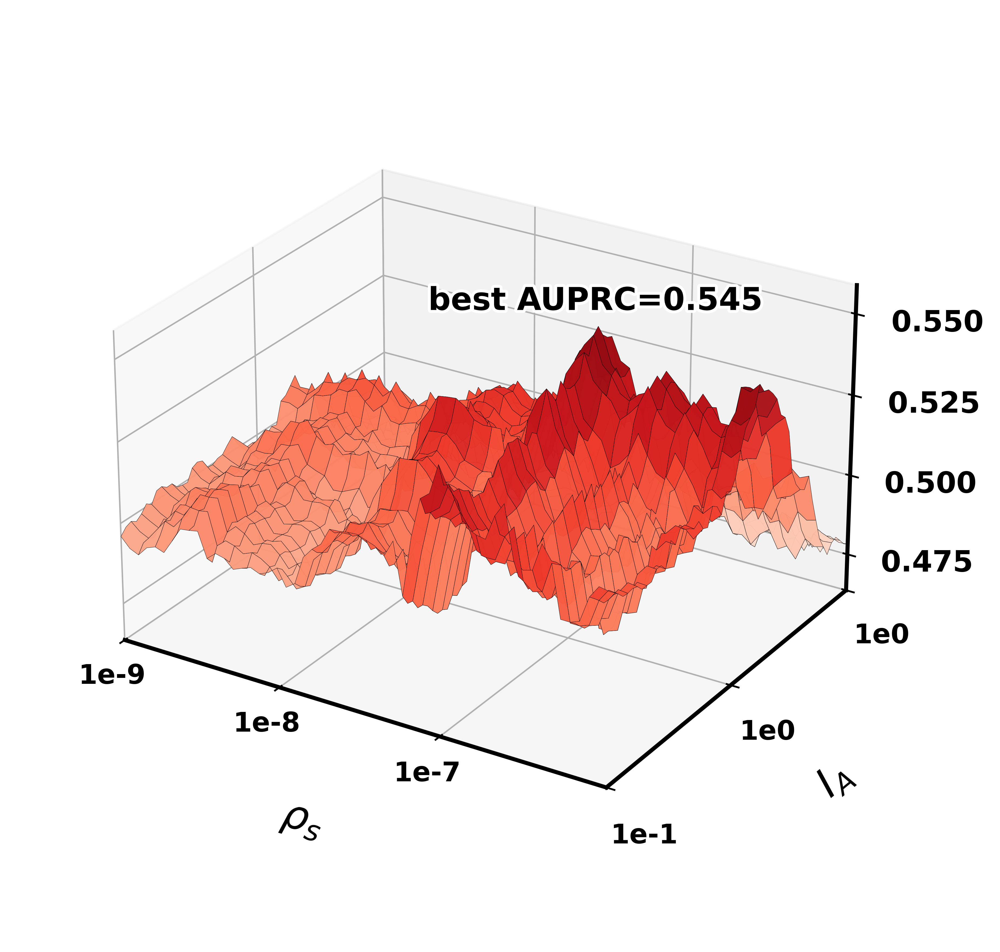

In [19]:
# =========================================================
# 7) 图 2：AUPRC_in surface
# =========================================================
valid_ap = mean_ap_in[np.isfinite(mean_ap_in)]

if valid_ap.size == 0:
    raise ValueError(
        "当前 log 坐标范围内没有有效 AUPRC_in。"
        "请扩大 RHO_LOG_LIM / IA_LOG_LIM，或检查 MIN_IN_SAMPLES。"
    )

# -----------------------------
# z 轴显示参数：重点修改这里
# -----------------------------
Z_TICK_LABEL_SIZE = 13      # z 轴刻度字体单独缩小，避免压到图像
Z_TICK_PAD = 16             # z 轴刻度与 z 轴之间的距离
Z_LABEL_PAD = 18



fig2 = plt.figure(figsize=(8.8, 6.6), dpi=600)
ax2 = fig2.add_subplot(1, 1, 1, projection="3d")

Z_ap = np.ma.masked_invalid(mean_ap_in)

surf2 = ax2.plot_surface(
    X_log_mesh,
    Y_log_mesh,
    Z_ap,
    cmap="Reds",
    edgecolor="k",
    linewidth=0.12,
    antialiased=True,
    alpha=0.96,
    vmin=np.nanmin(valid_ap),
    vmax=np.nanmax(valid_ap)
)

# =========================================================
# 坐标轴样式设置
# =========================================================
ax2.set_xlim(RHO_LOG_LIM)
ax2.set_ylim(IA_LOG_LIM)

# z 轴范围略微外扩，避免最高点和顶部刻度、文字过近
z_min = float(np.nanmin(valid_ap))
z_max = float(np.nanmax(valid_ap))
z_range = z_max - z_min
z_pad = 0.06 * z_range if z_range > 0 else 0.005
ax2.set_zlim(z_min - z_pad, z_max + z_pad)

# 坐标轴标题
ax2.set_xlabel(
    r"$\rho_s$",
    fontsize=AXIS_LABEL_SIZE,
    fontweight="bold",
    labelpad=24
)

ax2.set_ylabel(
    r"$I_{A}$",
    fontsize=AXIS_LABEL_SIZE,
    fontweight="bold",
    labelpad=24
)

# x/y 轴刻度显示为科学计数法
ax2.xaxis.set_major_formatter(FuncFormatter(sci_tick_from_log10))
ax2.yaxis.set_major_formatter(FuncFormatter(sci_tick_from_log10))

ax2.set_xticks(RHO_TICK_LOGS)
ax2.set_yticks(IA_TICK_LOGS)

# z 轴刻度数量减少，避免右侧文字过密
ax2.zaxis.set_major_locator(MaxNLocator(nbins=4, prune=None))

# z 轴刻度格式
ax2.zaxis.set_major_formatter(FuncFormatter(lambda z, pos: f"{z:.3f}"))

# x/y/z 轴刻度样式
ax2.tick_params(axis="x", labelsize=TICK_LABEL_SIZE, pad=2, width=1.5)
ax2.tick_params(axis="y", labelsize=TICK_LABEL_SIZE, pad=8, width=1.5)

# 关键修改：z 轴刻度单独设置更大的 pad，并略微减小字体
ax2.tick_params(
    axis="z",
    labelsize=Z_TICK_LABEL_SIZE,
    pad=Z_TICK_PAD,
    width=1.5
)

# 刻度字体加粗，并禁止 z 轴刻度被裁剪
for tick in ax2.get_xticklabels() + ax2.get_yticklabels():
    tick.set_fontweight("bold")

for tick in ax2.get_zticklabels():
    tick.set_fontweight("bold")
    tick.set_clip_on(False)

# 视角略微调整，避免 z 轴刻度压到曲面区域
ax2.view_init(elev=26, azim=-58)

# 缩小 3D 坐标轴在画布中的占比，给右侧 z 轴刻度留出空间
try:
    ax2.set_box_aspect((1.35, 1.15, 0.82), zoom=0.86)
except TypeError:
    ax2.set_box_aspect((1.35, 1.15, 0.82))
    ax2.dist = 11.5

# 网格线样式
ax2.xaxis._axinfo["grid"]["linewidth"] = 0.65
ax2.yaxis._axinfo["grid"]["linewidth"] = 0.65
ax2.zaxis._axinfo["grid"]["linewidth"] = 0.65

# 坐标轴线加粗
try:
    ax2.xaxis.line.set_linewidth(1.8)
    ax2.yaxis.line.set_linewidth(1.8)
    ax2.zaxis.line.set_linewidth(1.8)
except Exception:
    pass

# =========================================================
# 最优点文字标注
# =========================================================
if best_in_view and np.isfinite(ap_best):
    z_best = float(ap_best)
    z_text_offset = 0.10 * z_range if z_range > 0 else 0.006

    txt = ax2.text(
        best_x,
        best_y,
        z_best + z_text_offset,
        f"best AUPRC={ap_best:.3f}",
        color="black",
        fontsize=BEST_TEXT_SIZE,
        fontweight="bold",
        ha="center",
        va="bottom",
        zorder=31
    )
    txt.set_path_effects([
        pe.withStroke(linewidth=2.6, foreground="white")
    ])

# 关键修改：右侧不要设置得太满，否则 z 轴刻度容易贴边或压图
plt.subplots_adjust(
    left=0.08,
    right=0.88,
    bottom=0.08,
    top=0.94
)

if SAVE_FIG:
    fig2.savefig(
        OUT_FIG_AUPRC,
        bbox_inches="tight",
        pad_inches=0.25
    )
    print("[SAVED]", OUT_FIG_AUPRC)

plt.show()

In [25]:
# =========================
# 7) 找 mean_n 最接近 target_n 的网格点
# =========================
target_n = 105

# 只在 mean_ap_in 有效的位置里找
valid_mask = np.isfinite(mean_n) & np.isfinite(mean_ap_in)

if not np.any(valid_mask):
    raise ValueError("没有有效的 mean_n / mean_ap_in 网格点可供搜索。")

# 构造差值矩阵
diff_mat = np.full_like(mean_n, np.nan, dtype=float)
diff_mat[valid_mask] = np.abs(mean_n[valid_mask] - target_n)

# 找到最接近 target_n 的索引
i_tar, j_tar = np.unravel_index(np.nanargmin(diff_mat), diff_mat.shape)

n_tar = mean_n[i_tar, j_tar]
ap_tar = mean_ap_in[i_tar, j_tar]
cov_tar = mean_cov[i_tar, j_tar]
rho_tar = rho_cuts[j_tar]
ia_tar  = IA_cuts[i_tar]

print("=" * 90)
print(f"[TARGET n≈{target_n}]")
print(f"rho_th = {rho_tar:.6g}")
print(f"IA_th  = {ia_tar:.6g}")
print(f"mean_n = {n_tar:.3f}")
print(f"mean_cov = {cov_tar:.6f}")
print(f"mean_AUPRC_in_surface = {ap_tar:.6f}")
print("=" * 90)

NameError: name 'IA_cuts' is not defined